# Общая информация о задаче

Инвесторы из фонда «Shut Up and Take My Money» попросили подготовить исследование рынка общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.


План исследования:
1. Изучить общую информацию о датасете и провести предобработку данных
2. Провести исследования рынка общественного питания на основе данных
3. Провести детальное исследование по одной из категорий
4. Подготовить презентацию
5. Сформулировать выводы

## Общая информация о датасете и предобработка данных

In [1]:
import pandas as pd
import scipy.stats as stats
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
import warnings
from plotly import graph_objects as go
import math as mth
import plotly.express as px
import seaborn as sns
import folium
import json

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
#посчитаем количество заведений в датасете
data.shape[0]

8406

In [5]:
#приведем записи к нижнему регистру
data['address'] = data['address'].str.lower()
data['name'] = data['name'].str.lower()
data['avg_bill'] = data['avg_bill'].str.lower()

In [6]:
#заменим ё на е
data['address'] = data['address'].str.lower().str.replace('ё', 'е')

In [7]:
#проведем проверку на наличие явных дубликатов
data.duplicated().sum()

0

In [8]:
data.duplicated(subset = ['name','address']).sum()

4

In [9]:
data.drop_duplicates(subset = ['name','address']).reset_index()

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8397,8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8398,8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8399,8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,средний счёт:от 150 ₽,150.0,NaN,0,150.0
8400,8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [10]:
#добавим столбец с названиями улиц
data['street'] = data['address'].str.split(',').str[1]

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
 14  street             8406 non-null   object 
dtypes: float64(6), int64(1), object(8)
memory usage: 985.2+ KB


In [12]:
#добавим столбец с обозначением, что заведение работает ежедневно и круглосуточно
def hours(hours):
    if hours == 'ежедневно, круглосуточно':
        return True
    return False
data['is_24/7'] = data['hours'].apply(hours)


### Вывод  
Всего в датасете содержится информация о 8402 заведениях общественного питания в Москве. 

В ходе предобработки данных были выявлено отсутствие явных дубликатов, также были удалены 4 неявных дубликата. Пропусков в таблице есть, однако было принято решение их не заполнять. Также были приведены к нижнему регистру записи в некоторых столбцах. Были добавлены столбец с названием улиц, а также отдельный столбец с обозначением, что заведение работает ежедневно и круглосуточно


## Исследование рынка общественного питания на основе данных

In [13]:
#сгруппируем данные по категориям и найдем общее количество посадочных мест, количество заведений и средний рейтинг
c_data = data.groupby(by='category').agg({'seats':'sum','name':'count', 'rating': 'mean'}).sort_values('name').reset_index()
c_data

,category,seats,name,rating
0,булочная,13229.0,256,4.268359
1,столовая,16359.0,315,4.211429
2,быстрое питание,34513.0,603,4.050249
3,пиццерия,40350.0,633,4.301264
4,"бар,паб",58281.0,765,4.387712
5,кофейня,83511.0,1413,4.277282
6,ресторан,154869.0,2043,4.290357
7,кафе,118770.0,2378,4.123886


In [14]:
#построим столбчатую диаграмму по количеству заведений в категории
fig = px.bar(c_data,x='category',y='name')
fig.update_layout(title='Количество объектов по категориям',
                   xaxis_title='Наименование категории',
                   yaxis_title='Количество заведений')
fig.show()

Как можно увидеть на графиках больше всего заведений приходится на категории кафе и рестораны.

In [15]:
#построим столбчатую диаграмму по количеству посадочных в категории
c_data = c_data.sort_values('seats')
fig = px.bar(c_data,x='category',y='seats')
fig.update_layout(title='Количество посадочных мест по категориям',
                   xaxis_title='Наименование категории',
                   yaxis_title='Количество посадочных мест')
fig.show()

Больше всего посадочных мест приходятся на рестораны и кафе, здесь можно проследить прямую взаимосвязь между общим количеством заведений и общим количеством посадочных мест.

In [16]:
#присвоим новые названия в столбце
data['chain'] = data['chain'].replace(0, 'несетевое')
data['chain'] = data['chain'].replace(1, 'сетевое')


In [17]:
#сгруппируем данные по столбцу chain
ch_data = data.groupby(by='chain').agg({'name':'count'}).reset_index()
#построим столбчатую диаграмму по количеству заведений в каждой категории
fig = px.bar(ch_data,x='chain',y='name')
fig.update_layout(title='Количество сетевых и несетвых заведений',
                   xaxis_title='Наименование категории',
                   yaxis_title='Количество заведений')
fig.show()

Несетевых заведений оказалось значительно больше.

In [18]:
#создадим сводную таблицу и добавим столбец с процентом сетевых заведений в каждой категории
c_chain=data.pivot_table(index='category',values = 'name', columns ='chain', aggfunc ='count').reset_index()
c_chain['percent'] = round (c_chain['сетевое']/(c_chain['сетевое']+ c_chain['несетевое']) *100, 2 )
c_chain.sort_values('percent')

chain,category,несетевое,сетевое,percent
0,"бар,паб",596,169,22.09
7,столовая,227,88,27.94
3,кафе,1599,779,32.76
6,ресторан,1313,730,35.73
2,быстрое питание,371,232,38.47
4,кофейня,693,720,50.96
5,пиццерия,303,330,52.13
1,булочная,99,157,61.33


In [19]:
#построим столбчатую диаграмму проценту сетевых заведений в каждой категории
fig = px.bar(c_chain.sort_values('percent'),x='percent',y='category')
fig.update_layout(title='Процент сетевых заведений по категориям',
                   xaxis_title='Процент сетевых заведений',
                   yaxis_title='Наименование категории')
fig.show()

Больше 60% всех булочных являются сетевыми, у этой категории самый большой процент сетевых заведений. Также высокий процент у пиццерий и кофеен. Самый маленький процент у категории бар/паб, он чуть больше 20%. 

In [20]:
#сгруппируем данные по названию заведений и найдем топ-15 популярных сетей 
n_data = data.groupby(by='name').agg({'address':'count'}).sort_values(by='address', ascending=False).head(21).reset_index()
n_data

,name,address
0,кафе,189
1,шоколадница,120
2,домино'с пицца,77
3,додо пицца,74
4,one price coffee,72
5,яндекс лавка,69
6,cofix,65
7,prime,50
8,хинкальная,44
9,шаурма,43


In [21]:
#уберем данные, которые не являются названиями сетей
n_data = n_data.query('name != "кафе" and name != "хинкальная"and name != "шаурма" and name != "чайхана" and name != "ресторан" and name != "столовая"')
n_data

,name,address
1,шоколадница,120
2,домино'с пицца,77
3,додо пицца,74
4,one price coffee,72
5,яндекс лавка,69
6,cofix,65
7,prime,50
10,кофепорт,42
11,кулинарная лавка братьев караваевых,39
12,теремок,38


In [22]:
#построим столбчатую диаграмму по количетву заведений в самых популярных сетях
fig = px.bar(n_data,x='name',y='address')
fig.update_layout(title='Количество заведений в самых популярных сетях',
                   xaxis_title='Наименование сети',
                   yaxis_title='Количество заведений')
fig.show()

Самой большой сетью с большим отрывом является "Шоколадница". В подтверждение прошлого графика в топе находятся сети кофеен, пиццерий и булочных.

In [23]:
#создадим сводную таблицу с данными по категориям в каждом административном районе
d_data = data.pivot_table(index=['district','category'],values='name', aggfunc='count').reset_index()
#построим столбчатую диаграмму с общим количеством заведений и количеством заведений каждой категории по районам
fig = px.bar(d_data.sort_values('name'),x='name',y ='district', color ='category')
fig.update_layout(title='Количество объектов по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Наименование района')
fig.show()

С большим отрывом лидирует ЦАО, в остальных районах примерно одинаковое общее количество заведений, лишь в СЗАО их меньше 500.

In [24]:
#построим столбчатую диаграмму средних рейтингов по категориям
fig = px.bar(c_data.sort_values('rating'),x='category', y = 'rating',range_y=[4,4.5])
fig.update_layout(title='Средний рейтинг по категориям',
                   xaxis_title='Наименование категории',
                   yaxis_title='Средний рейтинг')
fig.show()

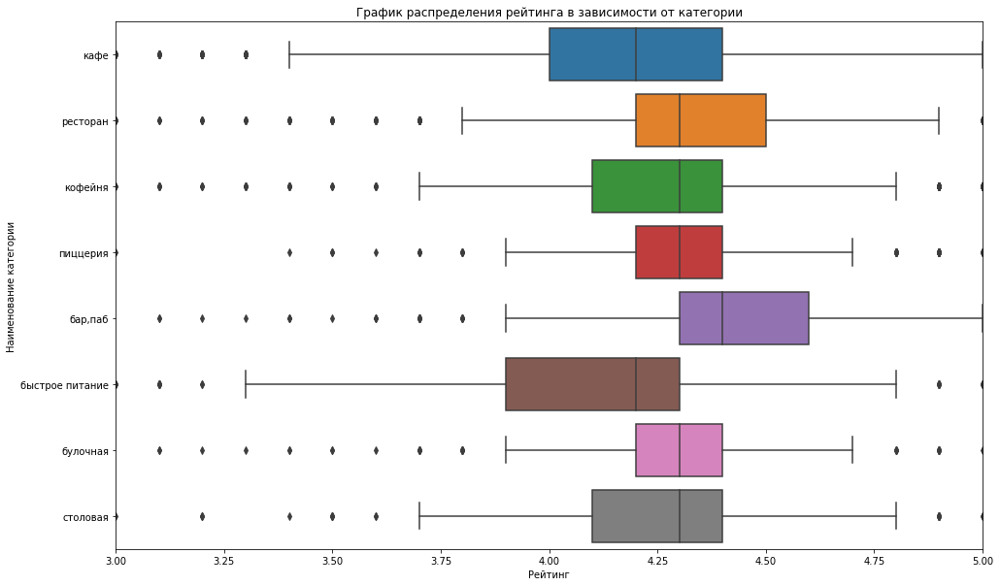

In [25]:
#построим график распределения рейтинга по каждой категории
plt.figure(figsize=(16, 10))
sns.boxplot(x = 'rating', y = 'category', data = data)
plt.xlim(3,5)
plt.title('График распределения рейтинга в зависимости от категории')
plt.xlabel('Рейтинг')
plt.ylabel('Наименование категории');

Самый низкий средний рейтинг и самый большой разброс рейтинга у булочных. Среднее значение рейтинга и медиана по каждой категории различаются, но общая тенденция сохраняется - у баров/пабов лучшие значения рейтинга.

In [26]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

По территориальному признаку лучший медианный рейтинг у заведений СВАО (свыше 4,7), а худший у ВАО (меньше 3,6).

In [27]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

In [28]:
#сгруппируем данные по названию улиц и найдем топ-15 по количеству 
s_data = data.groupby(by='street').agg({'name':'count'}).sort_values(by='name', ascending=False).head(15).reset_index()
#построим столбчатую диаграмму количества заведений по улицам (топ-15)
fig = px.bar(s_data,x='street',y='name')
fig.update_layout(title='Количество объектов по улицам (топ-15)',
                   xaxis_title='Наименование улицы',
                   yaxis_title='Количество заведений')
fig.show()

На первом месте по количеству заведений проспект Мира. Практически на всех представленных улицах, находится более 50 заведений.

In [29]:
#сгруппируем данные по названию улиц и остави только улицы с 1 заведением
s1_data = data.groupby(by='street').agg({'name':'count'}).query ('name == 1')
#соединим датасеты
new_data = s1_data.merge(data, on = 'street', how ='left')
new_data

,street,name_x,name_y,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
0,1-й автозаводский проезд,1,чайхана азия,кафе,"москва, 1-й автозаводский проезд, 5",Южный административный округ,"ежедневно, круглосуточно",55.704847,37.657065,4.2,средние,средний счёт:190–350 ₽,270.0,NaN,сетевое,20.0,True
1,1-й балтийский переулок,1,хуан хэ,ресторан,"москва, 1-й балтийский переулок, 3/25",Северный административный округ,"ежедневно, 12:00–22:00",55.810418,37.518824,4.4,высокие,средний счёт:1500–2000 ₽,1750.0,NaN,несетевое,60.0,False
2,1-й варшавский проезд,1,колизей,кафе,"москва, 1-й варшавский проезд, 1ас9",Южный административный округ,пн-чт 10:00–00:00; пт-вс 10:00–05:00,55.648674,37.627979,4.0,NaN,NaN,NaN,NaN,несетевое,NaN,False
3,1-й вешняковский проезд,1,deli by shell,кафе,"москва, 1-й вешняковский проезд, 15",Юго-Восточный административный округ,NaN,55.723152,37.794014,3.4,NaN,NaN,NaN,NaN,несетевое,NaN,False
4,1-й голутвинский переулок,1,shelby,"бар,паб","москва, 1-й голутвинский переулок, 6",Центральный административный округ,пн-пт 09:00–20:00,55.739600,37.613494,4.1,средние,средний счёт:500–800 ₽,650.0,NaN,несетевое,22.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,электрический переулок,1,галерея вкуса,столовая,"москва, электрический переулок, 3/10с1",Центральный административный округ,пн-пт 08:30–18:00,55.771942,37.575779,4.3,средние,средний счёт:250–400 ₽,325.0,NaN,сетевое,NaN,False
453,юго-западный административный округ,1,семь хлебов,кафе,"москва, юго-западный административный округ, а...",Юго-Западный административный округ,"пн-пт 09:00–20:00; сб,вс 08:00–20:00",55.677944,37.575202,4.9,NaN,NaN,NaN,NaN,несетевое,NaN,False
454,якиманский переулок,1,drink eat travel,кафе,"москва, якиманский переулок, 6, стр. 1",Центральный административный округ,пн-чт 08:30–21:00; пт 08:30–22:00; сб 10:00–22...,55.733299,37.610099,4.7,NaN,NaN,NaN,NaN,несетевое,46.0,False
455,яковоапостольский переулок,1,кофепровод,кофейня,"москва, яковоапостольский переулок, 9с1",Центральный административный округ,"пн-пт 08:30–21:00; сб,вс 10:00–20:00",55.758703,37.654258,4.4,средние,цена чашки капучино:200–250 ₽,NaN,225.0,несетевое,NaN,False


In [30]:
#сгруппируем данные из объединенного датасета по категориям
cs1_data = new_data.groupby(by ='category').agg({'name_y':'count'}).sort_values(by='name_y', ascending = False).reset_index()
fig = px.bar(cs1_data,x='category',y='name_y')
fig.update_layout(title='Количество заведений по категориям (одно заведение на улице)',
                   xaxis_title='Наименование категорий',
                   yaxis_title='Количество заведений')
fig.show()

In [31]:
#сгруппируем данные из объединенного датасета по столбцу
chs1_data = new_data.groupby(by ='chain').agg({'name_y':'count'}).reset_index()
fig = px.bar(chs1_data,x='chain',y='name_y')
fig.update_layout(title='Количество сетевых и несетвых заведений (одно заведение на улице)',
                   xaxis_title='Наименование категорий',
                   yaxis_title='Количество заведений')
fig.show()

In [32]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name_y']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
new_data.apply(create_clusters, axis=1)

# выводим карту
m

Если на какой-то улице всего 1 заведение, то скорее всего это будет несетевое кафе.  
По карте можно увидеть, что улицы всего с одним заведением общественного питания встречаются по всей территории Москвы, как в центре, так и на окраинах

In [33]:
#сгруппируем данные по медиане среднего чека в зависимости от района
bill_data = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values('middle_avg_bill',ascending=False)
bill_data

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [34]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill_data,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Предсказуемо самая высокая медиана среднего чек в ЦАО, также такое же значение у ЗАО. Одна из самых низких медиан среднего чека в СВАО, возможно это объясняет, почему у заведений этого района самый высокий средний рейтинг.

### Вывод 
На основании проведенного исследования рынка общественного питания в Москве можно сделать следующие выводы:
1. Больше всего заведений и посадочных мест приходится на категории кафе и рестораны  
2. Несетевые заведения встречаются чаще, при этом сетевыми чаще бывают булочные, кофейни и пиццерии  
3. Самая большая сеть по количеству заведений - "Шоколадница"  
4. Больше всего заведений приходится на ЦАО, меньше всего на СЗАО 
5. У баров/пабов лучшие значения среднего рейтинга и самая высокая медиана рейтинга  
6. Лучший медианный рейтинг у заведений СВАО, возможно это связано с тем, что там самая низкая медиана чека
7. Проспект Мира - лидер по количеству заведений
8. Самые высокие медианы среднего чека в ЦАО и ЗАО


## Дополнительное исследование по кофейням

In [35]:
#сделаем срез только по кофейням
df = data.query('category == "кофейня"')
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевое,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,сетевое,46.0,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,сетевое,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,сетевое,NaN,улица дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,несетевое,NaN,люблинская улица,False
8365,квадрат кофе,кофейня,"москва, волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,цена чашки капучино:100–220 ₽,NaN,160.0,несетевое,206.0,волгоградский проспект,False
8376,шоколад имбирь корица,кофейня,"москва, грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,несетевое,NaN,грайвороновская улица,False
8385,cafio,кофейня,"москва, новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,цена чашки капучино:80–120 ₽,NaN,100.0,несетевое,NaN,новохохловская улица,False


In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1398 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   object 
 13  seats              751 non-null    float64
 14  street             1413 non-null   object 
 15  is_24/7            1413 non-null   bool   
dtypes: bool(1), float64(6), 

In [37]:
#сгруппируем данные по районам
d_df = df.groupby(by ='district').agg({'name':'count','is_24/7':'sum'}).sort_values('name',ascending=False).reset_index()
d_df

,district,name,is_24/7
0,Центральный административный округ,428,26
1,Северный административный округ,193,5
2,Северо-Восточный административный округ,159,3
3,Западный административный округ,150,9
4,Южный административный округ,131,1
5,Восточный административный округ,105,5
6,Юго-Западный административный округ,96,7
7,Юго-Восточный административный округ,89,1
8,Северо-Западный административный округ,62,2


In [38]:
#построим столбчатую диаграмму количества кофеен по районам
fig = px.bar(d_df,x='district',y='name')
fig.update_layout(title='Количество кофеен по районам',
                   xaxis_title='Наименование района',
                   yaxis_title='Количество кофеен')
fig.show()

In [39]:
#сгруппируем данные по названию улиц и найдем медиану чека
b_df = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values('middle_avg_bill',ascending=False)
b_df

,district,middle_avg_bill
1,Западный административный округ,600.0
5,Центральный административный округ,500.0
0,Восточный административный округ,400.0
8,Южный административный округ,387.5
7,Юго-Западный административный округ,375.0
2,Северный административный округ,325.0
3,Северо-Восточный административный округ,325.0
4,Северо-Западный административный округ,325.0
6,Юго-Восточный административный округ,250.0


In [40]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=b_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек кофеен по районам',
).add_to(m)

# выводим карту
m

In [41]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

In [42]:
#сгруппируем данные по названию районов и найдем медиану стоимости чашки кофе
cc_df = df.groupby('district', as_index=False)['middle_coffee_cup'].agg('median').sort_values('middle_coffee_cup',ascending=False).reset_index()
fig = px.bar(cc_df,x='district',y='middle_coffee_cup',range_y=[120,200])
fig.update_layout(title='Стоимость чашки кофе',
                   xaxis_title='Наименование района',
                   yaxis_title='Стоимость')
fig.show()

In [43]:
##сгруппируем данные по названию улиц и найдем топ-20 по количеству кофеен
s_df = df.groupby(by='street').agg({'name':'count'}).sort_values(by='name', ascending=False).head(20).reset_index()
s_df

,street,name
0,проспект мира,36
1,ленинградский проспект,25
2,ленинский проспект,23
3,профсоюзная улица,18
4,проспект вернадского,16
5,каширское шоссе,16
6,варшавское шоссе,14
7,ленинградское шоссе,13
8,новослободская улица,13
9,кутузовский проспект,13


Этих улиц лучше избегать при открытии кофейни.

In [44]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### Вывод 
Всего в датасете представлено 1413 кофеен.  
Примерно треть от общего количества приходится на ЦАО, меньше всего кофеен встречается в СЗАО. При этом в каждом районе есть хотя бы одна круглосуточная кофейня.  
Медиана среднего чека выше всего в ЗАО и ЦАО, при этом у этих же районов плюс ЮЗАО самая высокая стоимость чашки кофе.   
Лучшие рейтинги у кофеен СВАО и ВАО.

## Общий вывод

В ходе исследования была проанализирована информация о 8402 заведениях общественного питания в Москве. 
Дополнительно было проведено исследование по одной из категорий - кофейни, их 1413 от общего числа заведений. 
В результате можно сформировать следующие выводы:

1. Больше всего заведений и посадочных мест приходится на категории кафе и рестораны  
2. Несетевые заведения встречаются чаще, при этом сетевыми чаще бывают булочные, кофейни и пиццерии  
3. Самая большая сеть по количеству заведений - "Шоколадница"  
4. Больше всего заведений приходится на ЦАО, меньше всего на СЗАО 
5. У баров/пабов лучшие значения среднего рейтинга и самая высокая медиана рейтинга  
6. Лучший медианный рейтинг у заведений СВАО, возможно это связано с тем, что там самая низкая медиана чека
7. Проспект Мира - лидер по количеству заведений
8. Самые высокие медианы среднего чека в ЦАО и ЗАО, у кофеен выделяются те же районы
9. Примерно треть от общего количества кофеен приходится на ЦАО
10. В каждом районе можно найти круглосуточную кофейню
11. Лучшие рейтинги у кофеен СВАО и ВАО
  
**Общие рекомендации инвесторам по открытию кофейни в Москве**  
Предоставленных данных недостаточно, чтобы дать точные рекомендации по местоположению, количеству посадочных мест и ценовой политике кофейни. Однако можно дать некоторые рекомендации.  
Лучшим с точки с зрения местоположения является ВАО. Здесь не так много открытых кофеен и совсем мало круглосуточных. При этом жители и гости данного района, ставят высокие оценки кофейням, что может привлекать новых посетителей. Кроме того, в этом районе самая низкая медиана средней стоимости чашки кофе, что привлекательно для посетителей.
